In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import tensorflow as tf
tf.get_logger().setLevel('ERROR')

import logging
logging.getLogger('tensorflow').setLevel(logging.ERROR)

import warnings
warnings.filterwarnings("ignore")

import glob
import random
import subprocess

import numpy as np
import pandas as pd
from numpy import asarray

import cv2
from PIL import Image

import graphviz
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns

from skimage.io import imread

from tensorflow import keras
from tensorflow.keras import layers, models, Input, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.model_selection import train_test_split
from skimage import filters
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from IPython.display import FileLink

from concurrent.futures import ThreadPoolExecutor, as_completed

E0000 00:00:1749716249.863758      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749716249.941936      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
safe_imgs = []
talking_imgs = []
texting_imgs = []
turning_imgs = []
other_imgs = []

# # Local
# safe_path = "dataset/Revitsone-5classes/safe_driving"
# talking_path = "dataset/Revitsone-5classes/talking_phone"
# texting_path = "dataset/Revitsone-5classes/texting_phone"
# turning_path = "dataset/Revitsone-5classes/turning"
# other_path = "dataset/Revitsone-5classes/other_activities"

# Kaggle
safe_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving"
talking_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone"
texting_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/texting_phone"
turning_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/turning"
other_path = "/kaggle/input/revitsone-5class/Revitsone-5classes/other_activities"

thu thập đường dẫn (path) của tất cả các tệp ảnh từ các thư mục khác nhau và sắp xếp chúng theo từng loại hành vi.

In [5]:
for path, img_list in zip([safe_path, talking_path, texting_path, turning_path, other_path],
                          [safe_imgs, talking_imgs, texting_imgs, turning_imgs, other_imgs]):
    for img in os.listdir(path):
        if img.endswith(".png") or img.endswith(".jpg"):
            img_list.append(os.path.join(path, img))

In [31]:
# Thống kê và hiển thị số lượng ảnh mỗi hành vi
import_results = {
    'Category': ['safe_driving', 'talking_phone', 'texting_phone', 'turning', 'other_activities'],
    'Number of Images': [len(safe_imgs), len(talking_imgs), len(texting_imgs), len(turning_imgs), len(other_imgs)]
}

df_import_results = pd.DataFrame(import_results)
df_import_results

,Category,Number of Images
0,safe_driving,2203
1,talking_phone,2169
2,texting_phone,2203
3,turning,2063
4,other_activities,2128


In [7]:
#trực quan hóa dữ liệu, tức là hiển thị ngẫu nhiên một số hình ảnh từ một danh mục (loại hành vi) cụ thể.
def random_images(image_list, category_name, num_images=6):

    plt.figure(figsize=(15, 9))
    plt.suptitle(f"Random images of {category_name}", fontsize=20)

    for i in range(num_images):
        plt.subplot(2, 3, i+1)
        random_img = random.choice(image_list)
        imgs = imread(random_img)
        plt.imshow(imgs)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

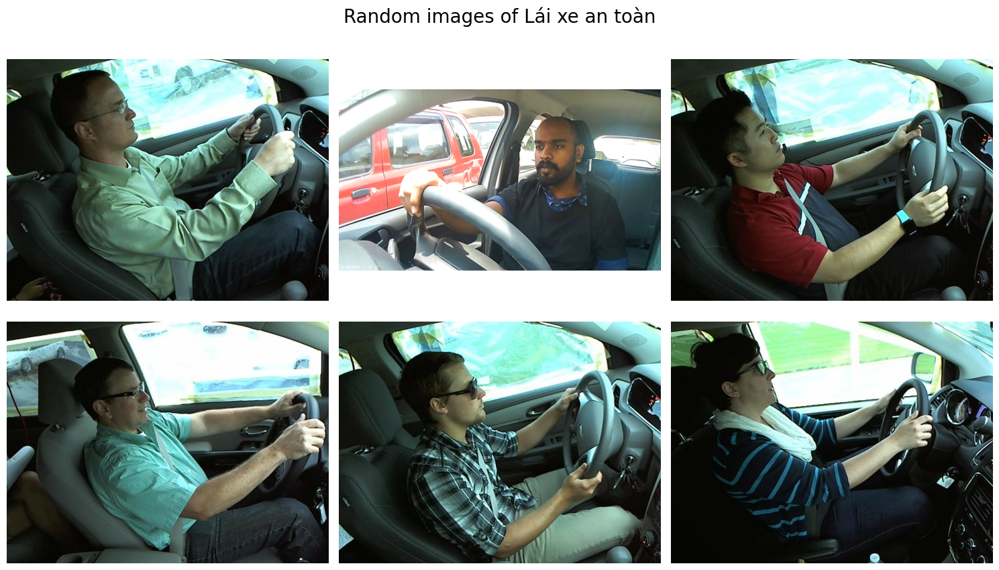

In [11]:
random_images(safe_imgs, "Lái xe an toàn")

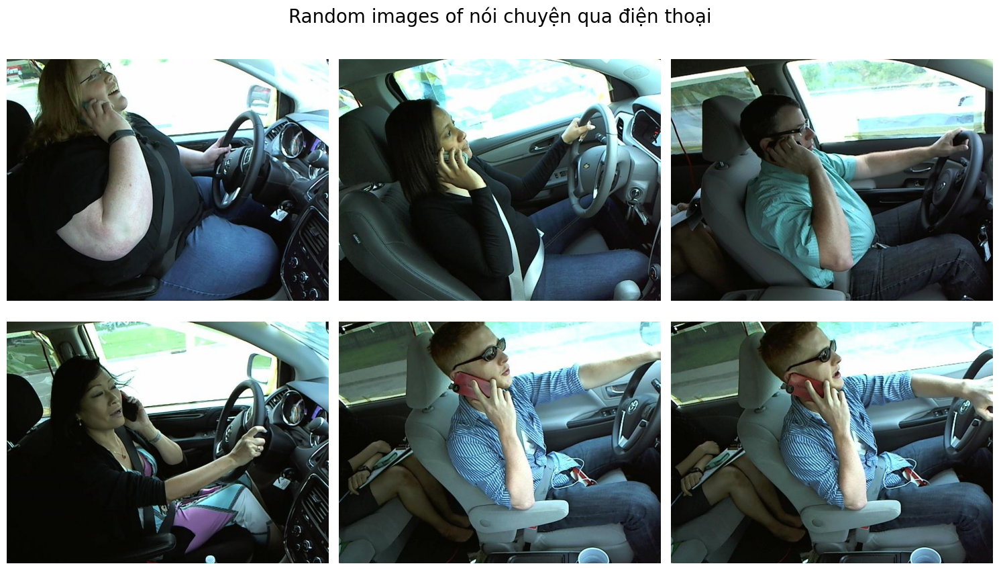

In [10]:
random_images(talking_imgs, "nói chuyện qua điện thoại")

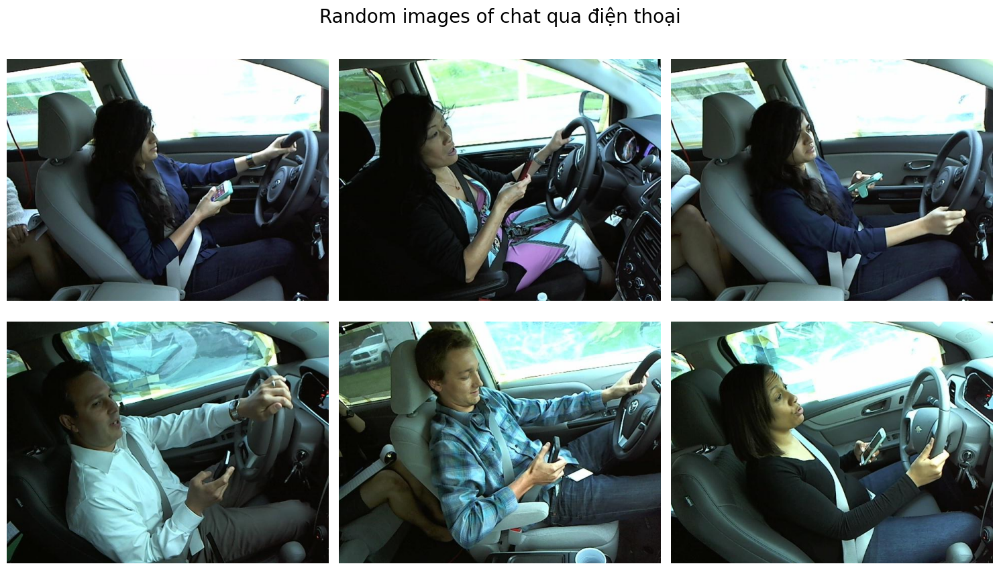

In [12]:
random_images(texting_imgs, "chat qua điện thoại")

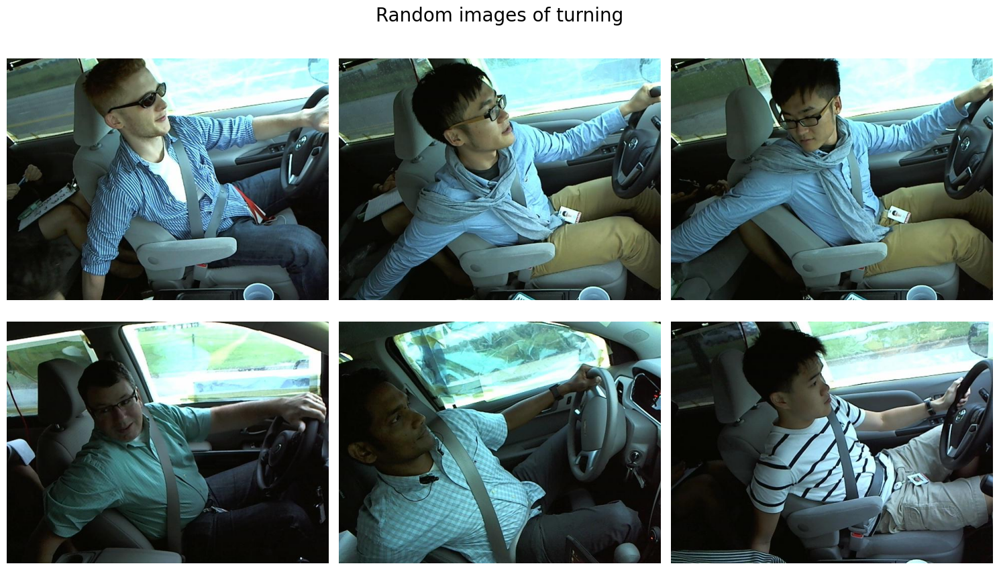

In [9]:
random_images(turning_imgs, "turning")

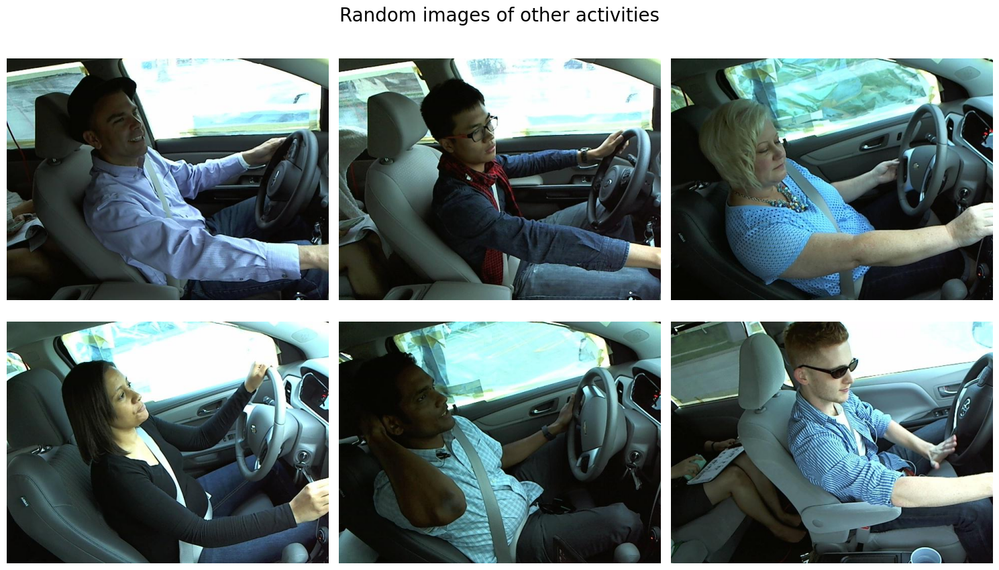

In [10]:
random_images(other_imgs, "other activities")

### Phân chia dữ liệu & gắn label
- Tỉ lệ: (train, test, valid) = (70 : 15 : 15)

In [9]:
# Hàm 1: Tạo DataFrame
def create_df(img_list, label):
    df = pd.DataFrame({'image': img_list, 'label': label})
    return df

In [10]:
# Hàm 2: Phân chia dữ liệu
def split_data(img_list, label):
    # Chia lần 1: tách ra 15% cho tập Test
    train_imgs, test_imgs = train_test_split(img_list, test_size=0.15, random_state=42)
    # Chia lần 2: từ 85% còn lại, tách ra một phần cho tập Validation
    train_imgs, valid_imgs = train_test_split(train_imgs, test_size=0.1765, random_state=42)
    return create_df(train_imgs, label), create_df(test_imgs, label), create_df(valid_imgs, label)

In [11]:
#phân chia cho từng loại hành vi
train_safe_df, test_safe_df, valid_safe_df = split_data(safe_imgs, 'Safe')
train_talking_df, test_talking_df, valid_talking_df = split_data(talking_imgs, 'Talking')
train_texting_df, test_texting_df, valid_texting_df = split_data(texting_imgs, 'Texting')
train_turning_df, test_turning_df, valid_turning_df = split_data(turning_imgs, 'Turning')
train_other_df, test_other_df, valid_other_df = split_data(other_imgs, 'Other')

In [12]:
#Thống kê kết quả phân chia
split_results = {
    'Dataset': ['Train', 'Test', 'Validation'],
    'Safe': [len(train_safe_df), len(test_safe_df), len(valid_safe_df)],
    'Talk': [len(train_talking_df), len(test_talking_df), len(valid_talking_df)],
    'Text': [len(train_texting_df), len(test_texting_df), len(valid_texting_df)],
    'Turn': [len(train_turning_df), len(test_turning_df), len(valid_turning_df)],
    'Other': [len(train_other_df), len(test_other_df), len(valid_other_df)]
}

df_split_results = pd.DataFrame(split_results)
df_split_results

,Dataset,Safe,Talk,Text,Turn,Other
0,Train,1541,1517,1541,1443,1488
1,Test,331,326,331,310,320
2,Validation,331,326,331,310,320


In [13]:
#gộp (concatenate) tất cả các DataFrame nhỏ của từng loại hành vi lại để tạo thành ba DataFrame lớn, hoàn chỉnh cho mỗi tập dữ liệu: train_df, test_df, và valid_df.
train_df = pd.concat([train_safe_df, train_talking_df, train_texting_df, train_turning_df, train_other_df], ignore_index=True)
test_df = pd.concat([test_safe_df, test_talking_df, test_texting_df, test_turning_df, test_other_df], ignore_index=True)
valid_df = pd.concat([valid_safe_df, valid_talking_df, valid_texting_df, valid_turning_df, valid_other_df], ignore_index=True)

In [14]:
train_df.head(10)

,image,label
0,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
1,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
2,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
3,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
4,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
5,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
6,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
7,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
8,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe
9,/kaggle/input/revitsone-5class/Revitsone-5clas...,Safe


### Tiền xử lý dữ liệu
- Loại bỏ ảnh mờ, nhiễu, lỗi; chia thành nhiều luồng để kiểm tra ảnh
- Kiểm tra kích thước
- Tạo Dataset từ các DataFrame chứa thông tin về hình ảnh và label, kết hợp chuẩn hoá và tăng cường

#### Loại bỏ ảnh mờ, nhiễu, lỗi

In [15]:
# Hàm kiểm tra độ mờ của ảnh bằng phương sai của toán tử Laplacian
def is_blurry(image_path, threshold=100):
    image = cv2.imread(image_path)
    # Chuyển ảnh sang thang độ xám để xử lý
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Tính phương sai của ảnh sau khi áp dụng bộ lọc Laplacian
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    # Nếu phương sai thấp hơn ngưỡng, ảnh được coi là mờ
    return laplacian_var < threshold

In [16]:
# Hàm kiểm tra một ảnh có hợp lệ không (mở được và không mờ)
def is_valid(image_path, threshold=100):
    try:
        # Thử mở và xác thực ảnh
        img = Image.open(image_path)
        img.verify()
        
        # Nếu ảnh mở được, kiểm tra xem nó có bị mờ không
        if is_blurry(image_path, threshold):
            print(f"Image is blurry: {image_path}")
            return image_path  # Trả về đường dẫn nếu không hợp lệ (mờ)
    except Exception as e:
        print(f"Error opening image: {image_path}")
        return image_path  # Trả về đường dẫn nếu không hợp lệ (hỏng)
    
    # Nếu ảnh vượt qua tất cả kiểm tra, trả về None (hợp lệ)
    return None

In [18]:
# Hàm loại bỏ các ảnh không hợp lệ khỏi DataFrame (sử dụng đa luồng để tăng tốc)
def remove_invalid_images(df, threshold=100, num_workers=4, chunk_size=100):
    invalid_images = []
    # Xử lý DataFrame theo từng đoạn nhỏ để quản lý bộ nhớ và tiến trình
    for start in range(0, len(df), chunk_size):
        end = min(start + chunk_size, len(df))
        chunk_df = df[start:end]
        
        # Sử dụng ThreadPoolExecutor để chạy kiểm tra song song trên nhiều luồng
        with ThreadPoolExecutor(max_workers=num_workers) as executor:
            # Gửi các tác vụ kiểm tra ảnh vào pool và lưu lại tương lai (future)
            future_to_image = {executor.submit(is_valid, image_path, threshold): image_path for image_path in chunk_df['image']}
            
            # Lặp qua các future khi chúng hoàn thành
            for future in as_completed(future_to_image):
                image_path = future_to_image[future]
                try:
                    # Lấy kết quả trả về từ hàm is_valid
                    result = future.result()
                    # Nếu kết quả không phải None, tức là ảnh không hợp lệ
                    if result is not None:
                        invalid_images.append(result)
                except Exception as e:
                    # Bắt các lỗi có thể xảy ra trong quá trình chạy của luồng
                    print(f"Error processing image: {image_path}")
                    invalid_images.append(image_path)
    
    # Lọc DataFrame, loại bỏ các dòng có ảnh nằm trong danh sách không hợp lệ
    df = df[~df['image'].isin(invalid_images)]
    # Trả về DataFrame đã được làm sạch
    return df

In [19]:
# Áp dụng hàm làm sạch cho cả ba bộ dữ liệu
train_df = remove_invalid_images(train_df)
test_df = remove_invalid_images(test_df)
valid_df = remove_invalid_images(valid_df)

Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_7276.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_31355.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_27005.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_62307.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_57869.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/safe_driving/img_11914.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone/img_4008.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone/img_34796.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/talking_phone/img_44101.jpg
Ảnh bị mờ: /kaggle/input/revitsone-5class/Revitsone-5classes/texting_phone/img_26837.jpg
Lỗi khi mở hình ảnh: /kaggle/input/revitsone-5class/Revitsone-5classes/turning/img_67523.jpg
Lỗi khi mở hình ảnh: /kag

#### Kiểm tra kích thước ảnh

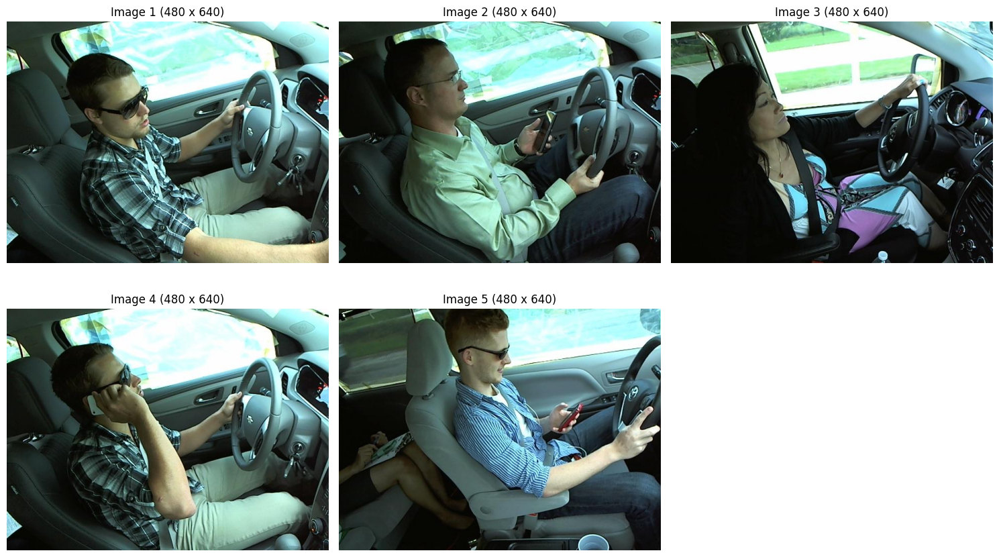

In [20]:
# --- HIỂN THỊ ẢNH NGẪU NHIÊN SAU KHI GỘP VÀ LÀM SẠCH ---

# Tạo một khung vẽ lớn
plt.figure(figsize=(15, 9))

# Lặp 5 lần để hiển thị 5 ảnh
for i in range(5):
    # Chọn ngẫu nhiên một đường dẫn ảnh từ cột 'image' của tập huấn luyện
    random_imgs = random.choice(train_df['image'])
    
    # Đọc ảnh từ đường dẫn vừa chọn bằng OpenCV
    image = cv2.imread(random_imgs)
    # Lấy chiều cao và chiều rộng của ảnh
    height, width = image.shape[:2]
    
    # Tạo một ô con trong lưới 2x3
    plt.subplot(2, 3, i+1)
    # Hiển thị ảnh. Lưu ý: cv2 đọc ảnh theo BGR, matplotlib hiển thị theo RGB,
    # nên cần chuyển đổi màu sắc để hiển thị đúng.
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    # Đặt tiêu đề cho ảnh, bao gồm cả kích thước của nó
    plt.title(f"Image {i+1} ({height} x {width})")
    # Ẩn trục tọa độ
    plt.axis('off')

# Tự động điều chỉnh bố cục
plt.tight_layout()
# Hiển thị kết quả
plt.show()

#### Tăng cường dữ liệu (data augmentation) & Chuấn hoá (normalization)
- Tạo các đối tượng ImageDataGenerator để thực hiện các biến đổi dữ liệu trên 3 tập train, test, valid.
  
- Chuẩn hoá giá trị pixel của ảnh về khoảng [0,1].

- Tăng cường dữ liệu:

|                                  | Tập train                     | Tập valid/test                |
|----------------------------------|-------------------------------|-------------------------------|
| **Xoay ngẫu nhiên ảnh**          | Trong khoảng ±20 độ           | Trong khoảng ±10 độ           |
| **Dịch chuyển ảnh ngẫu nhiên**   |                               |                               |
| Theo chiều ngang                 | Tối đa 20%                    | Tối đa 10%                    |
| Theo chiều dọc                   | Tối đa 20%                    | Tối đa 10%                    |
| **Làm méo ảnh**                  | Tối đa 20%                    | 0.1                           |
| **Phóng to/ thu nhỏ ngẫu nhiên** | Từ 0.9 đến 1.25 lần           | Từ 0.95 đến 1.05 lần          |
| **Lật ngang ngẫu nhiên**         | Có                            | Có                            |
| **Lấp đầy các pixel mới**        | Phản chiếu các pixel gần nhất | Phản chiếu các pixel gần nhất |
| **Điều chỉnh độ sáng của ảnh**   | Từ 0.5 đến 1.5 lần            | -                             |


In [23]:
# --- ĐỊNH NGHĨA SIÊU THAM SỐ ---

# Kích thước lô: Số lượng ảnh được xử lý trong một lần trước khi mô hình cập nhật trọng số.
batch_size = 64

# Kích thước mục tiêu của ảnh: Tất cả ảnh sẽ được resize về kích thước này.
img_height = 224
img_width = 224

In [24]:
# Thiết lập trình tạo dữ liệu với Tăng cường (Data Augmentation)

# --- THIẾT LẬP TĂNG CƯỜNG DỮ LIỆU ---

# 1. Trình tạo dữ liệu cho tập HUẤN LUYỆN (với các phép biến đổi mạnh)
train_generator = ImageDataGenerator(
    rescale=1./255,                 # Chuẩn hóa giá trị pixel về khoảng [0, 1]
    rotation_range=20,              # Xoay ảnh ngẫu nhiên trong khoảng 20 độ
    width_shift_range=0.2,          # Dịch chuyển ảnh theo chiều ngang tối đa 20%
    height_shift_range=0.2,         # Dịch chuyển ảnh theo chiều dọc tối đa 20%
    shear_range=0.2,                # Áp dụng biến đổi cắt (nghiêng ảnh)
    zoom_range=[0.9, 1.25],         # Phóng to/thu nhỏ ảnh ngẫu nhiên
    horizontal_flip=True,           # Lật ảnh theo chiều ngang
    vertical_flip=False,            # Không lật ảnh theo chiều dọc (vì không tự nhiên)
    fill_mode='reflect',            # Lấp đầy các pixel bị thiếu khi biến đổi bằng cách phản chiếu
    data_format='channels_last',    # Định dạng dữ liệu (height, width, channels)
    brightness_range=[0.5, 1.5]     # Thay đổi độ sáng ngẫu nhiên
)

# 2. Trình tạo dữ liệu cho tập KIỂM ĐỊNH và KIỂM THỬ (với các phép biến đổi nhẹ hơn)
val_test_generator = ImageDataGenerator(
    rescale=1./255,                 # Luôn cần chuẩn hóa
    rotation_range=10,              # Biến đổi nhẹ hơn để không làm thay đổi bản chất ảnh
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=[0.95, 1.05],
    horizontal_flip=True,
    fill_mode='reflect'
)

#### Tạo Dataset từ DataFrame
- Sử dụng phương thức flow_from_dataframe() của ImageDataGenerator
- class_mode: Loại của nhãn. "categorical": one-hot encoding.
- x_col: Tên cột chứa đường dẫn đến ảnh.
- y_col: Tên cột chứa nhãn của ảnh.

In [25]:
# --- TẠO LUỒNG DỮ LIỆU HUẤN LUYỆN ---

# Sử dụng train_generator đã định nghĩa trước đó
train_dataset = train_generator.flow_from_dataframe(
  dataframe=train_df,           # Nguồn dữ liệu là DataFrame huấn luyện
  x_col="image",                # Cột 'image' chứa đường dẫn (dữ liệu đầu vào X)
  y_col="label",                # Cột 'label' chứa nhãn (dữ liệu đầu ra Y)
  target_size=(img_height, img_width), # Resize tất cả ảnh về 224x224
  class_mode="categorical",     # Chuyển đổi nhãn dạng text thành one-hot vector
  batch_size=batch_size,        # Kích thước lô là 64
  shuffle=True,                 # Xáo trộn dữ liệu sau mỗi epoch
  seed=42                       # Đặt seed để đảm bảo tính tái lập
)

Found 7511 validated image filenames belonging to 5 classes.


In [26]:
test_dataset = val_test_generator.flow_from_dataframe(
  dataframe=test_df,
  class_mode='categorical',
  x_col="image",
  y_col="label",
  batch_size=batch_size,
  seed=42,
  shuffle=True,
  target_size=(img_height, img_width)
)

Found 1613 validated image filenames belonging to 5 classes.


In [27]:
val_dataset = val_test_generator.flow_from_dataframe(
  dataframe=valid_df,
  class_mode='categorical',
  x_col="image",
  y_col="label",
  batch_size=batch_size,
  seed=42,
  shuffle=True,
  target_size=(img_height, img_width)
)

Found 1615 validated image filenames belonging to 5 classes.


##### Lấy một batch dữ liệu từ train_dataset

Shape of images batch: (64, 224, 224, 3)
Shape of labels batch: (64, 5)


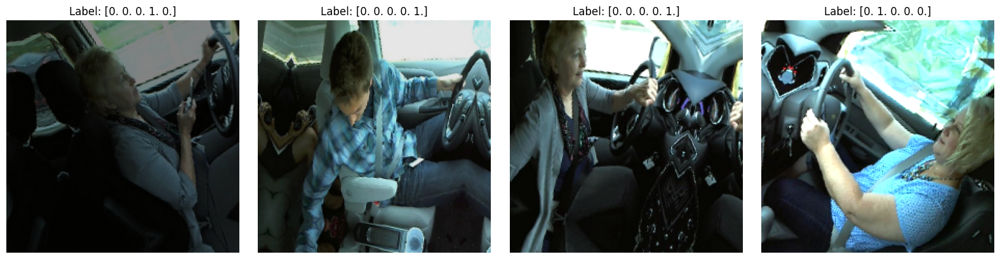

In [28]:
# --- KIỂM TRA ĐẦU RA CỦA TRÌNH TẠO DỮ LIỆU ---

# 1. Lấy ra một lô (batch) dữ liệu từ trình tạo
# Hàm next() sẽ yêu cầu train_dataset tạo ra và trả về một lô dữ liệu tiếp theo.
images, labels = next(train_dataset)

# 2. In ra kích thước (shape) của dữ liệu
# Giúp xác nhận rằng dữ liệu có đúng định dạng mà mô hình mong đợi.
print("Shape of images batch:", images.shape)
print("Shape of labels batch:", labels.shape)

# 3. Trực quan hóa một vài mẫu từ lô dữ liệu vừa lấy
num_examples = 4  # Số lượng ảnh cần hiển thị
num_rows = 1
num_cols = num_examples

plt.figure(figsize=(16, 4)) # Tạo một khung vẽ

for i in range(num_examples):
    plt.subplot(num_rows, num_cols, i+1)
    
    # Hiển thị ảnh thứ i trong lô. Ảnh này đã được tăng cường và chuẩn hóa.
    plt.imshow(images[i]) 
    
    # Hiển thị nhãn tương ứng. Nhãn này đã được chuyển thành vector one-hot.
    plt.title(f"Label: {labels[i]}") 
    
    plt.axis("off") # Ẩn trục tọa độ

plt.tight_layout()
plt.show()

Các hình ảnh hiển thị sẽ có vẻ hơi bị méo, xoay, hoặc phóng to. Đây chính là kết quả của việc tăng cường dữ liệu mà bạn đã thiết lập trong train_generator. Điều này xác nhận rằng quá trình augmentation đang hoạt động.
Tiêu đề của mỗi ảnh sẽ là một vector one-hot, ví dụ: Label: [0. 1. 0. 0. 0.]. Điều này xác nhận rằng class_mode='categorical' đã hoạt động chính xác.

## Xây dựng mô hình

### AlexNet

- Được giới thiệu năm 2012, sử dụng chủ yếu cho các tác vụ nhận dạng và phân loại hình ảnh.

- Cấu trúc gồm 8 lớp:

    - 5 lớp đầu tiên: các lớp tích chập (convolutional layers), một số được theo sau bởi các lớp tổng hợp tối đa (max-pooling layers).

    - 3 lớp sau: các lớp được kết nối đầy đủ (fully connected layers).

- AlexNet sử dụng các hàm kích hoạt ReLU và điều chuẩn dropout (dropout regularization) để ngăn chặn quá khớp (overfitting).

#### Thiết lập mô hình

In [33]:
def conv_block(x, filters, kernel_size, strides, activation='relu'):
    x = layers.Conv2D(filters, kernel_size, strides, activation=activation)(x)
    x = layers.BatchNormalization()(x)
    return x

def AlexNet():
    input_layer = layers.Input((224, 224, 3))
    
    # Convolutional layers
    x = conv_block(input_layer, filters=96, kernel_size=11, strides=4)
    x = layers.MaxPooling2D(3, 2)(x)
    
    x = conv_block(x, filters=256, kernel_size=5, strides=1)
    x = layers.MaxPooling2D(3, 2)(x)
    
    x = conv_block(x, filters=384, kernel_size=3, strides=1)
    x = conv_block(x, filters=384, kernel_size=3, strides=1)
    x = conv_block(x, filters=256, kernel_size=3, strides=1)
    x = layers.MaxPooling2D(3, 2)(x)
    
    # Flatten and fully connected layers
    x = layers.Flatten()(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(4096, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    
    # Output layer
    output_layer = layers.Dense(5, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output_layer)

    return model

In [34]:
alex_model = AlexNet()
alex_model.summary()

I0000 00:00:1749651388.008072      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 54, 54, 96)          │          34,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 54, 54, 96)          │             384 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 26, 26, 96)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 22, 22, 256)         │         614,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 22, 22, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 10, 10, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 384)           │         885,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 8, 8, 384)           │           1,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 6, 6, 384)           │       1,327,488 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 6, 6, 384)           │           1,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 4, 4, 256)           │         884,992 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 4, 4, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 1, 1, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4096)                │       1,052,672 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 4096)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4096)                │      16,781,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 4096)                │              

 Total params: 21,607,173 (82.42 MB)

 Trainable params: 21,604,421 (82.41 MB)

 Non-trainable params: 2,752 (10.75 KB)

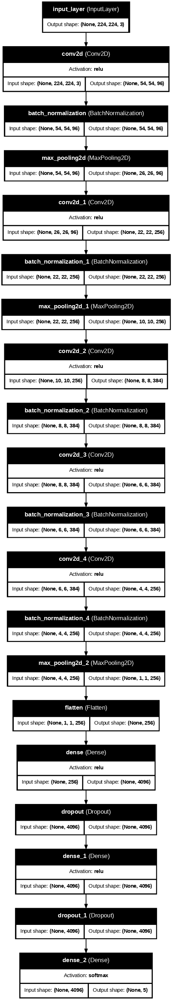

In [35]:
plot_model(
    alex_model,
    to_file='alex_model.png',
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    show_layer_activations=True,
    dpi=75
)

#### Các tham số
- optimizer: Adam, với learning rate = 0.001. Adam là một thuật toán tối ưu hóa phổ biến trong deep learning với khả năng tự điều chỉnh tỷ lệ học.

- loss_function: Binary Crossentropy, thích hợp cho bài toán phân loại nhị phân

- metrics: accuracy (tỉ lệ dự đoán chính xác của mô hình)

In [37]:
optimizer = Adam(learning_rate=0.001)
loss_function = CategoricalCrossentropy()
metrics = ['accuracy', 'Precision', 'Recall']

- Điều chỉnh learning rate: ReduceLROnPlateau giảm tốc độ học theo hệ số factor (= 0.1) nếu giá trị của val_loss không cải thiện sau 3 epoch (patience = 3). Thiết đặt min_lr (tốc độ học tối thiểu).

In [38]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.00001, verbose=1)

- Dừng huấn luyện sớm trước khi cán mốc epoch cuối cùng nếu mô hình không cải thiện sau 5 epoch liên tiếp (patience = 5) để tránh overfitting (quá khớp dữ liệu).

In [39]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [41]:
alex_model.compile(loss=loss_function, optimizer=optimizer, metrics=metrics)

#### Huấn luyện mô hình

In [42]:
num_epochs = 20

history = alex_model.fit(train_dataset, epochs=num_epochs, 
                         validation_data=val_dataset, callbacks=[reduce_lr, early_stopping])

Epoch 1/15


I0000 00:00:1749651557.866201    1024 service.cc:148] XLA service 0x78325401a590 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749651557.867107    1024 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1749651558.652012    1024 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/118 ━━━━━━━━━━━━━━━━━━━━ 29:18 15s/step - Precision: 0.2000 - Recall: 0.0312 - accuracy: 0.2344 - loss: 1.8868

I0000 00:00:1749651565.622324    1024 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


118/118 ━━━━━━━━━━━━━━━━━━━━ 153s 1s/step - Precision: 0.2326 - Recall: 0.0520 - accuracy: 0.2098 - loss: 2.6399 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2087 - val_loss: 1.6219 - learning_rate: 0.0010
Epoch 2/15
118/118 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - Precision: 0.0998 - Recall: 1.4237e-04 - accuracy: 0.2064 - loss: 1.6393 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2384 - val_loss: 1.6051 - learning_rate: 0.0010
Epoch 3/15
118/118 ━━━━━━━━━━━━━━━━━━━━ 125s 1s/step - Precision: 0.2785 - Recall: 0.0017 - accuracy: 0.2114 - loss: 1.6334 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2031 - val_loss: 1.6066 - learning_rate: 0.0010
Epoch 4/15
118/118 ━━━━━━━━━━━━━━━━━━━━ 127s 1s/step - Precision: 0.2113 - Recall: 0.0011 - accuracy: 0.2272 - loss: 1.6184 - val_Precision: 0.5000 - val_Recall: 6.1920e-04 - val_accuracy: 0.2712 - val_loss: 1.5491 - learning_rate: 0.0010
Epoch 5/15
118/118 ━━━━━━━━━━━━━━━━━━━━

In [1]:
alex_model.save('alex_model.h5')
FileLink(r'alex_model.h5')

NameError: name 'alex_model' is not defined

/kaggle/working/alex_model.h5

#### Đánh giá

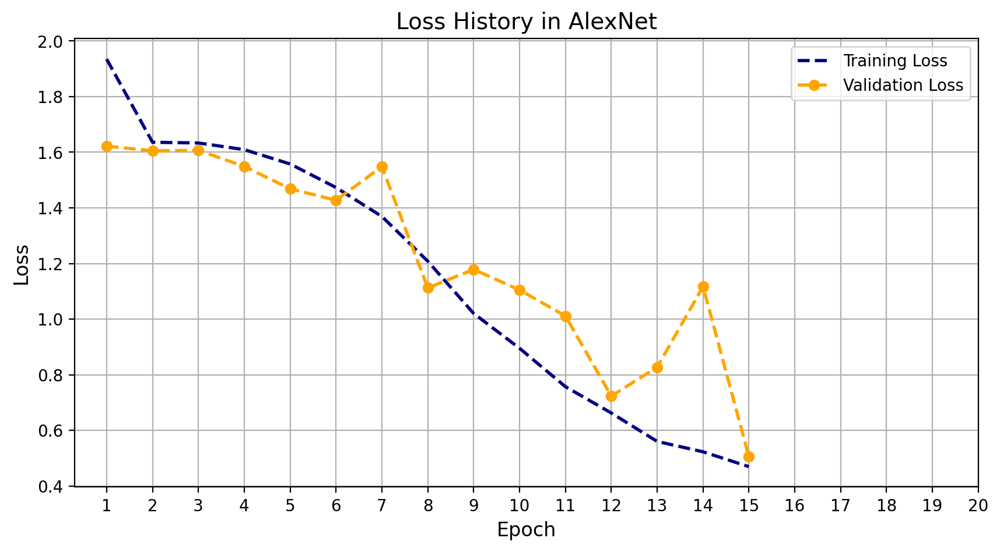

In [46]:
train_loss_alex = history.history['loss']
valid_loss_alex = history.history['val_loss']
train_accuracy_alex = history.history['accuracy']
valid_accuracy_alex = history.history['val_accuracy']

epoch_count = range(1, len(train_loss_alex) + 1)


plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_loss_alex, 'r--', color='navy', label='Training Loss', linewidth=2)
plt.plot(epoch_count, valid_loss_alex, '--bo', color='orange', label='Validation Loss', linewidth=2)

plt.title('Loss History in AlexNet', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)

plt.grid(True)
plt.legend(loc='upper right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

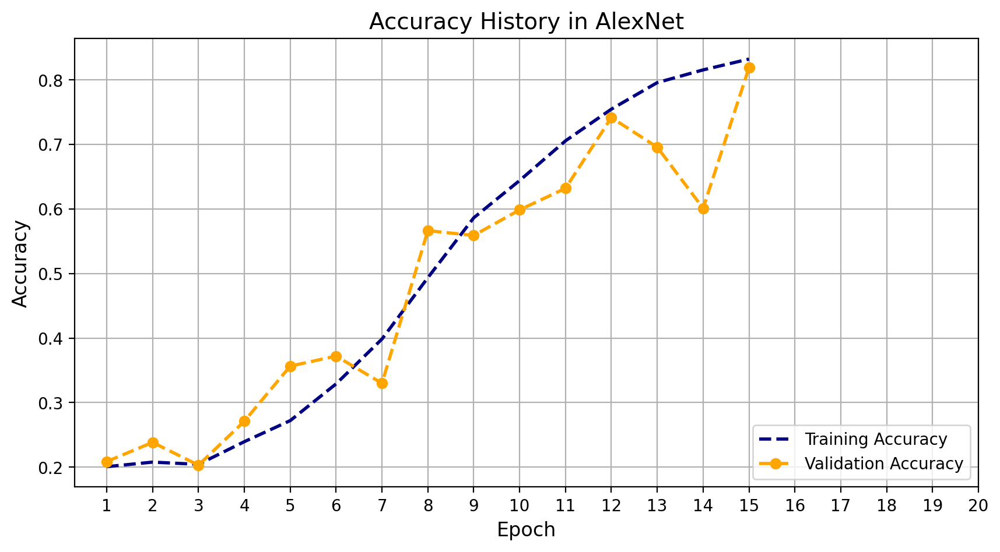

In [47]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_accuracy_alex, 'r--', color='navy', label='Training Accuracy', linewidth=2)
plt.plot(epoch_count, valid_accuracy_alex, '--bo', color='orange', label='Validation Accuracy', linewidth=2)

plt.title('Accuracy History in AlexNet', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)

plt.grid(True)
plt.legend(loc='lower right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

In [48]:
predictions_alex = alex_model.predict(test_dataset)

26/26 ━━━━━━━━━━━━━━━━━━━━ 23s 843ms/step


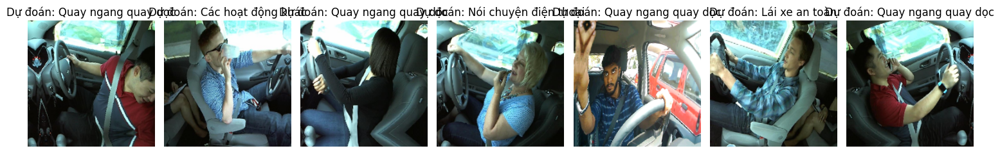

In [59]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Danh sách nhãn lớp
class_names = [
    "Lái xe an toàn",
    "Nói chuyện điện thoại",
    "Nhắn tin trên điện thoại",
    "Quay ngang quay dọc",
    "Các hoạt động khác"
]

num_images = 7
random_indices = random.sample(range(len(test_dataset)), num_images)

num_rows = 1
num_cols = num_images

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3))

for i, idx in enumerate(random_indices):
    image, label = test_dataset[idx]
    prediction = predictions_alex[idx]
    
    ax = axes[i]
    ax.imshow(image[0])  
    ax.axis('off')  
    
    predicted_class = np.argmax(prediction)
    predicted_label = class_names[predicted_class]
    
    ax.set_title(f'Dự đoán: {predicted_label}')

plt.tight_layout()
plt.show()


In [60]:
evaluation_alex = alex_model.evaluate(test_dataset)

26/26 ━━━━━━━━━━━━━━━━━━━━ 21s 802ms/step - Precision: 0.8512 - Recall: 0.7780 - accuracy: 0.8062 - loss: 0.5186


In [61]:
eval_dict_alex = {metric_name: evaluation_value for metric_name, evaluation_value in zip(alex_model.metrics_names, evaluation_alex)}
eval_df_alex = pd.DataFrame([eval_dict_alex])

print("Evaluation metrics:")
eval_df_alex

Evaluation metrics:


,loss,compile_metrics
0,0.504934,0.809671


### GoogLeNet
*yeah, not GoogleNet*

- GoogLeNet hay Inception, là một CNN sâu do Google phát triển.

- Điểm đặc biệt: sử dụng một mô-đun được gọi là ***Inception***. Mỗi mô-đun thực hiện nhiều phép tích chập và phép gộp (pooling) với các kích thước bộ lọc khác nhau, sau đó kết hợp các kết quả lại.

- Rất sâu (22 lớp), để học các biểu diễn phức tạp của dữ liệu hình ảnh.
Vẫn đạt hiệu quả tính toán cao nhờ sử dụng các kỹ thuật như global average pooling và 1x1 convolutions.

- Ứng dụng trong phân loại hình ảnh, phát hiện đối tượng, phân đoạn ngữ nghĩa,...

#### Thiết lập mô hình

In [29]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

# 1. Load mô hình gốc (không có phần fully-connected top)
base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# 2. Đóng băng mô hình gốc để không huấn luyện lại
base_model.trainable = False

# 3. Thêm lớp đầu ra mới cho bài toán 5 lớp
inputs = Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.4)(x)
outputs = Dense(5, activation='softmax')(x)

# 4. Tạo mô hình hoàn chỉnh
model = Model(inputs, outputs)


I0000 00:00:1749716452.344079      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1749716452.344851      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Compile và huấn luyện

In [32]:
# Compile
optimizer = Adam(learning_rate=0.001)
loss_function = CategoricalCrossentropy()
metrics = ['accuracy', 'Precision', 'Recall']

model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-5, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Huấn luyện
history = model.fit(train_dataset, epochs=20,
                    validation_data=val_dataset,
                    callbacks=[reduce_lr, early_stopping])


Epoch 1/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 162s 1s/step - Precision: 0.7162 - Recall: 0.4201 - accuracy: 0.5987 - loss: 1.0165 - val_Precision: 0.8120 - val_Recall: 0.5511 - val_accuracy: 0.6941 - val_loss: 0.8007 - learning_rate: 0.0010
Epoch 2/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 129s 1s/step - Precision: 0.7253 - Recall: 0.4360 - accuracy: 0.6024 - loss: 0.9716 - val_Precision: 0.8126 - val_Recall: 0.5263 - val_accuracy: 0.6898 - val_loss: 0.8035 - learning_rate: 0.0010
Epoch 3/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 130s 1s/step - Precision: 0.7400 - Recall: 0.4407 - accuracy: 0.6101 - loss: 0.9676 - val_Precision: 0.8138 - val_Recall: 0.5628 - val_accuracy: 0.7115 - val_loss: 0.7692 - learning_rate: 0.0010
Epoch 4/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 130s 1s/step - Precision: 0.7458 - Recall: 0.4685 - accuracy: 0.6264 - loss: 0.9423 - val_Precision: 0.8314 - val_Recall: 0.5437 - val_accuracy: 0.7263 - val_loss: 0.7501 - learning_rate: 0.0010
Epoch 5/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 130s 1s/step - Preci

In [36]:
# Lưu mô hình đã huấn luyện xong
model.save('inception_model.keras')
FileLink('inception_model.keras')

/kaggle/working/inception_model.keras

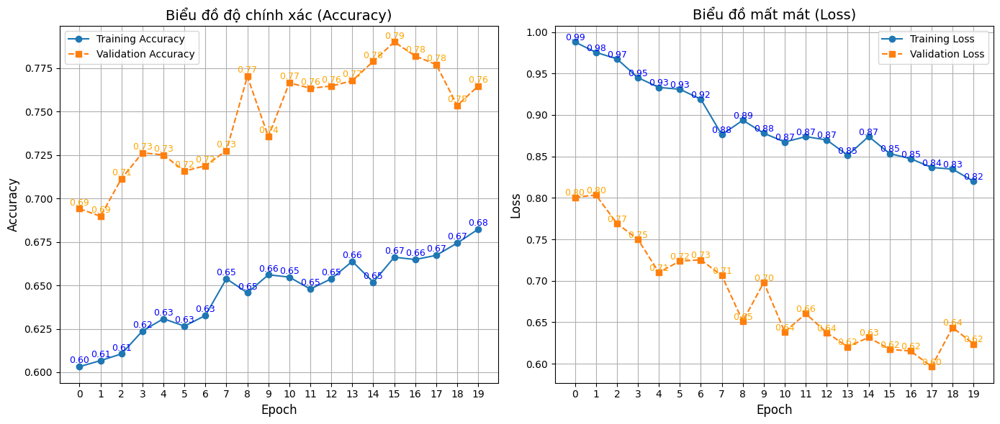

In [38]:
# Trích xuất các giá trị từ history
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc))

plt.figure(figsize=(14, 6))

# -------- Accuracy Plot --------
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, 'o-', label='Training Accuracy')
plt.plot(epochs_range, val_acc, 's--', label='Validation Accuracy')
plt.title('Biểu đồ độ chính xác (Accuracy)', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.grid(True)
plt.legend()
plt.xticks(epochs_range)

# Hiển thị số lên từng điểm - Training Accuracy
for i, value in enumerate(acc):
    plt.text(i, value + 0.002, f"{value:.2f}", ha='center', fontsize=9, color='blue')

# Hiển thị số lên từng điểm - Validation Accuracy
for i, value in enumerate(val_acc):
    plt.text(i, value + 0.002, f"{value:.2f}", ha='center', fontsize=9, color='orange')

# -------- Loss Plot --------
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, 'o-', label='Training Loss')
plt.plot(epochs_range, val_loss, 's--', label='Validation Loss')
plt.title('Biểu đồ mất mát (Loss)', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.grid(True)
plt.legend()
plt.xticks(epochs_range)

# Hiển thị số lên từng điểm - Training Loss
for i, value in enumerate(loss):
    plt.text(i, value + 0.002, f"{value:.2f}", ha='center', fontsize=9, color='blue')

# Hiển thị số lên từng điểm - Validation Loss
for i, value in enumerate(val_loss):
    plt.text(i, value + 0.002, f"{value:.2f}", ha='center', fontsize=9, color='orange')

plt.tight_layout()
plt.show()

### ResNet (Residual Networks)
**

ResNet, hay Mạng dư, là một kiến trúc CNN sâu được phát triển để giải quyết vấn đề suy giảm độ chính xác (degradation problem) trong các mạng nơ-ron cực sâu.

Điểm đặc biệt: sử dụng các khối dư (residual blocks). Mỗi khối dư có một hoặc nhiều lớp tích chập, nhưng điểm mấu chốt là có một kết nối tắt (shortcut connection) cộng trực tiếp đầu vào của khối vào đầu ra của các lớp bên trong. Điều này giúp gradient lan truyền hiệu quả hơn, cho phép huấn luyện mạng rất sâu.

Rất sâu (hàng chục đến hàng trăm lớp, ví dụ: ResNet-50, ResNet-101, ResNet-152), để học các biểu diễn phức tạp của dữ liệu hình ảnh mà không gặp phải vấn đề suy giảm hiệu suất. Vẫn đạt hiệu quả huấn luyện cao nhờ khả năng giải quyết vấn đề suy giảm độ chính xác thông qua các kết nối tắt.

Ứng dụng rộng rãi trong phân loại hình ảnh, phát hiện đối tượng, phân đoạn ngữ nghĩa, nhận dạng khuôn mặt, và nhiều tác vụ thị giác máy tính khác.

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
Epoch 1/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 167s 1s/step - Precision: 0.1781 - Recall: 0.0241 - accuracy: 0.2072 - loss: 1.8405 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2526 - val_loss: 1.6219 - learning_rate: 0.0010
Epoch 2/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - Precision: 0.0000e+00 - Recall: 0.0000e+00 - accuracy: 0.2178 - loss: 1.6130 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2211 - val_loss: 1.6022 - learning_rate: 0.0010
Epoch 3/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - Precision: 0.0000e+00 - Recall: 0.0000e+00 - accuracy: 0.2372 - loss: 1.5986 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2669 - val_loss: 1.5879 - learning_rate: 0.0010
Epoch 4/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 140s 1s/step - Precision: 0.0000e+00 - Recall: 0.0000e+00 - accuracy: 0.2277 - loss: 1.5992 - val_Precision: 0.0000e+00 - val_Recall: 0.0000e+00 - val_accuracy: 0.2

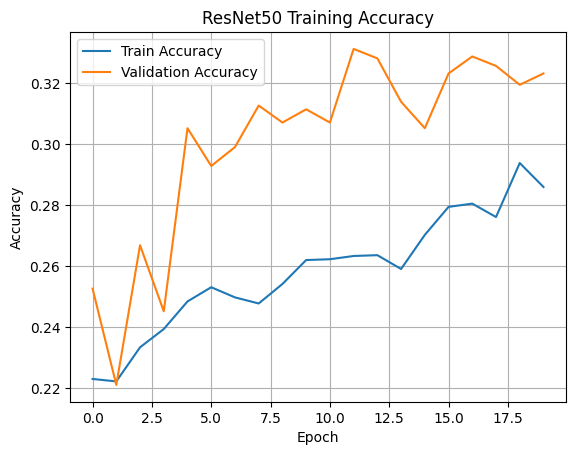

In [32]:
# 📌 1. Import các thư viện cần thiết
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import matplotlib.pyplot as plt

# 📌 2. Tải mô hình ResNet50 có trọng số ImageNet, bỏ phần fully connected (include_top=False)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# 📌 3. Đóng băng ResNet để không huấn luyện lại các lớp gốc
base_model.trainable = False

# 📌 4. Xây dựng mô hình mới với phần đầu ra 5 lớp
inputs = Input(shape=(224, 224, 3))                      # Lớp đầu vào
x = base_model(inputs, training=False)                   # Truyền qua ResNet50 (không huấn luyện lại)
x = GlobalAveragePooling2D()(x)                          # Trung bình hóa không gian đặc trưng
x = Dense(1024, activation='relu')(x)                    # Lớp fully connected ẩn
x = Dropout(0.4)(x)                                      # Dropout để chống overfitting
outputs = Dense(5, activation='softmax')(x)              # Lớp đầu ra 5 lớp (softmax)

# 📌 5. Khởi tạo mô hình hoàn chỉnh
resnet_model = Model(inputs=inputs, outputs=outputs)

# 📌 6. Compile mô hình với hàm mất mát, tối ưu và các chỉ số đánh giá
optimizer = Adam(learning_rate=0.001)
loss_function = CategoricalCrossentropy()
metrics = ['accuracy', 'Precision', 'Recall']

resnet_model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

# 📌 7. Khai báo các callback: giảm learning rate và dừng sớm
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3,
                              min_lr=1e-5, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5,
                               restore_best_weights=True)

# 📌 8. Huấn luyện mô hình
# ➤ train_dataset và val_dataset phải được định nghĩa trước (dạng tf.data hoặc ImageDataGenerator)
num_epochs = 20
history_resnet = resnet_model.fit(
    train_dataset,
    epochs=num_epochs,
    validation_data=val_dataset,
    callbacks=[reduce_lr, early_stopping]
)

# 📌 9. Vẽ biểu đồ độ chính xác theo từng epoch
plt.plot(history_resnet.history['accuracy'], label='Train Accuracy')
plt.plot(history_resnet.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('ResNet50 Training Accuracy')
plt.legend()
plt.grid(True)
plt.show()


### GoogLeNet
tinh chỉnh lại

In [36]:
# ===== ĐỊNH NGHĨA CÁC HÀM TẠO KHỐI CƠ BẢN =====

def conv_block(x, filters, kernel_size, strides, activation='relu'):
    """
    Tạo khối convolution cơ bản bao gồm Conv2D + BatchNormalization
    """
    # Lớp convolution 2D với padding='same' để giữ nguyên kích thước
    x = layers.Conv2D(filters, kernel_size, strides, padding='same', activation=activation)(x)
    # Chuẩn hóa batch để ổn định quá trình training
    x = layers.BatchNormalization()(x)
    return x

def inception_module(x, filters):
    """
    Module Inception với 4 đường song song đặc trưng của GoogLeNet
    filters: list chứa số filters cho từng đường [path1, path2_1x1, path2_3x3, path3_1x1, path3_5x5, path4_1x1]
    """
    
    # Đường 1: Convolution 1x1 trực tiếp (giảm chiều + feature extraction)
    path1 = conv_block(x, filters[0], (1, 1), strides=1)

    # Đường 2: 1x1 Conv (giảm chiều) -> 3x3 Conv (feature extraction chi tiết)
    path2 = conv_block(x, filters[1], (1, 1), strides=1)  # Bottleneck layer
    path2 = conv_block(path2, filters[2], (3, 3), strides=1)  # Main convolution

    # Đường 3: 1x1 Conv (giảm chiều) -> 5x5 Conv (feature extraction diện rộng)
    path3 = conv_block(x, filters[3], (1, 1), strides=1)  # Bottleneck layer
    path3 = conv_block(path3, filters[4], (5, 5), strides=1)  # Large kernel convolution

    # Đường 4: MaxPooling 3x3 (preserve spatial info) -> 1x1 Conv (giảm chiều)
    path4 = layers.MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)  # Pooling với stride=1
    path4 = conv_block(path4, filters[5], (1, 1), strides=1)  # Dimension reduction

    # Nối tất cả các đường lại theo chiều depth (axis=-1)
    return layers.concatenate([path1, path2, path3, path4], axis=-1)

def GoogLeNet():
    """
    Xây dựng mô hình GoogLeNet (Inception v1) từ đầu
    Kiến trúc: Conv -> Pooling -> Inception blocks -> Global pooling -> Dense
    """
    
    # ===== LỚP ĐẦU VÀO =====
    # Kích thước đầu vào: 224x224x3 (RGB images)
    input_layer = layers.Input((224, 224, 3))

    # ===== KHỐI CONVOLUTION ĐẦU TIÊN =====
    # Conv 7x7 với stride=2 để giảm kích thước nhanh (224->112)
    x = conv_block(input_layer, 64, (7, 7), strides=(2, 2))
    # MaxPooling để giảm thêm kích thước (112->56)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    # ===== NHÓM INCEPTION ĐẦU TIÊN =====
    # Inception 3a: 64 + (96->128) + (16->32) + 32 = 256 filters
    x = inception_module(x, [64, 96, 128, 16, 32, 32])
    # Inception 3b: 128 + (128->192) + (32->96) + 64 = 480 filters  
    x = inception_module(x, [128, 128, 192, 32, 96, 64])

    # MaxPooling để giảm kích thước spatial (56->28)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    # ===== NHÓM INCEPTION THỨ HAI =====
    # Inception 4a
    x = inception_module(x, [192, 96, 208, 16, 48, 64])
    # Inception 4b
    x = inception_module(x, [160, 112, 224, 24, 64, 64])
    # Inception 4c  
    x = inception_module(x, [128, 128, 256, 24, 64, 64])
    # Inception 4d
    x = inception_module(x, [112, 144, 288, 32, 64, 64])
    # Inception 4e
    x = inception_module(x, [256, 160, 320, 32, 128, 128])

    # MaxPooling để giảm kích thước spatial (28->14)
    x = layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

    # ===== NHÓM INCEPTION THỨ BA =====
    # Inception 5a
    x = inception_module(x, [256, 160, 320, 32, 128, 128])
    # Inception 5b (cuối cùng)
    x = inception_module(x, [384, 192, 384, 48, 128, 128])

    # ===== PHẦN CLASSIFICATION =====
    # Global Average Pooling thay vì Flatten để giảm overfitting
    x = layers.GlobalAveragePooling2D()(x)

    # Fully connected layer với dropout để regularization
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dropout(0.4)(x)  # Dropout 40% để tránh overfitting

    # Lớp đầu ra: 5 classes cho bài toán driver behavior classification
    output_layer = layers.Dense(5, activation='softmax')(x)

    # Tạo model từ input và output
    model = models.Model(inputs=input_layer, outputs=output_layer)

    return model

# ===== TẠO VÀ HIỂN THỊ MÔ HÌNH =====
inception_model = GoogLeNet()
inception_model.summary()  # In ra cấu trúc mô hình

# ===== TẠO VISUALIZATION =====
# Lấy 50 layers đầu để vẽ sơ đồ (tránh quá phức tạp)
layer_outputs = [layer.output for layer in inception_model.layers[:50]]
sub_model = Model(inputs=inception_model.input, outputs=layer_outputs)

# Vẽ sơ đồ mô hình và lưu thành file PNG
plot_model(sub_model, to_file='inception_model.png', show_shapes=True, dpi=75)

# ===== CẤU HÌNH TRAINING =====
# Optimizer: Adam với learning rate = 0.001
optimizer = Adam(learning_rate=0.001)
# Loss function: Categorical crossentropy cho multi-class classification
loss_function = CategoricalCrossentropy()
# Metrics: Độ chính xác, Precision, Recall
metrics = ['accuracy', 'Precision', 'Recall']

# Callbacks để tối ưu quá trình training
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.00001, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True) 

# Compile mô hình với các tham số đã định nghĩa
inception_model.compile(loss=loss_function, optimizer=optimizer, metrics=metrics) 

# ===== BẮT ĐẦU TRAINING =====
num_epochs = 20  # Số epochs tối đa

# Bắt đầu quá trình huấn luyện với validation và callbacks
history_inception = inception_model.fit(
    train_dataset,           # Dữ liệu training
    epochs=num_epochs,       # Số epochs
    validation_data=val_dataset,  # Dữ liệu validation
    callbacks=[reduce_lr, early_stopping]  # Callbacks để tối ưu
)

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_337 (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ input_layer_9[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_337   │ (None, 112, 112, 64)   │            256 │ conv2d_337[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_24          │ (None, 56, 56, 64)     │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_339 (Conv2D)       │ (None, 56, 56, 96)     │          6,240 │ max_pooling2d_24[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_341 (Conv2D)       │ (None, 56, 56, 16)     │          1,040 │ max_pooling2d_24[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_339   │ (None, 56, 56, 96)     │            384 │ conv2d_339[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_341   │ (None, 56, 56, 16)     │             64 │ conv2d_341[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_25          │ (None, 56, 56, 64)     │              0 │ max_pooling2d_24[0][0] │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_338 (Conv2D)       │ (None, 56, 56, 64)     │          4,160 │ max_pooling2d_24[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_340 (Conv2D)       │ (None, 56, 56, 128)    │        110,720 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_342 (Conv2D)       │ (None, 56, 56, 32)     │         12,832 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_343 (Conv2D)       │ (None, 56, 56, 32)     │          2,080 │ max_pooling2d_25[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_338   │ (None, 56, 56, 64)     │            256 │ conv2d_338[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_340   │ (None, 56, 56, 128)    │            512 │ conv2d_340[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3

 Total params: 6,914,805 (26.38 MB)

 Trainable params: 6,900,757 (26.32 MB)

 Non-trainable params: 14,048 (54.88 KB)

Epoch 1/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 284s 2s/step - Precision: 0.3290 - Recall: 0.0831 - accuracy: 0.2781 - loss: 1.6856 - val_Precision: 0.2050 - val_Recall: 0.2050 - val_accuracy: 0.2050 - val_loss: 5.9043 - learning_rate: 0.0010
Epoch 2/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - Precision: 0.6697 - Recall: 0.4067 - accuracy: 0.5515 - loss: 1.1261 - val_Precision: 0.2019 - val_Recall: 0.2019 - val_accuracy: 0.2019 - val_loss: 5.7742 - learning_rate: 0.0010
Epoch 3/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - Precision: 0.8179 - Recall: 0.7035 - accuracy: 0.7591 - loss: 0.6513 - val_Precision: 0.2929 - val_Recall: 0.2464 - val_accuracy: 0.2941 - val_loss: 3.8668 - learning_rate: 0.0010
Epoch 4/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - Precision: 0.8853 - Recall: 0.8270 - accuracy: 0.8599 - loss: 0.4058 - val_Precision: 0.5269 - val_Recall: 0.4737 - val_accuracy: 0.4991 - val_loss: 1.7891 - learning_rate: 0.0010
Epoch 5/20
118/118 ━━━━━━━━━━━━━━━━━━━━ 143s 1s/step - Preci

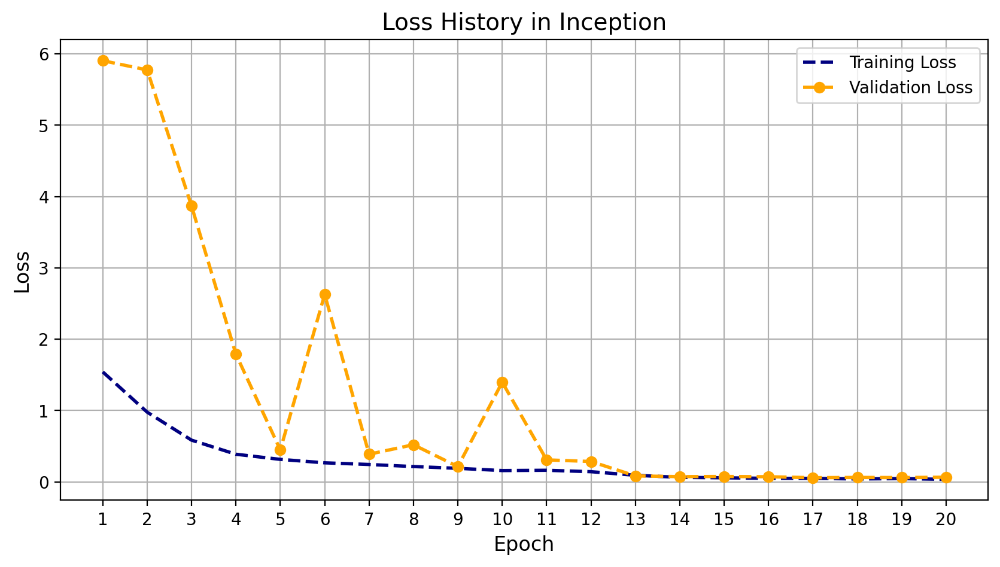

In [39]:
train_loss_inception = history_inception.history['loss']
valid_loss_inception = history_inception.history['val_loss']
train_accuracy_inception = history_inception.history['accuracy']
valid_accuracy_inception = history_inception.history['val_accuracy']

epoch_count = range(1, len(train_loss_inception) + 1)

plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_loss_inception, 'r--', color='navy', label='Training Loss', linewidth=2)
plt.plot(epoch_count, valid_loss_inception, '--bo', color='orange', label='Validation Loss', linewidth=2)

plt.title('Loss History in Inception', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)

plt.grid(True)
plt.legend(loc='upper right')

plt.xticks(np.arange(1, 21, 1))

plt.show()

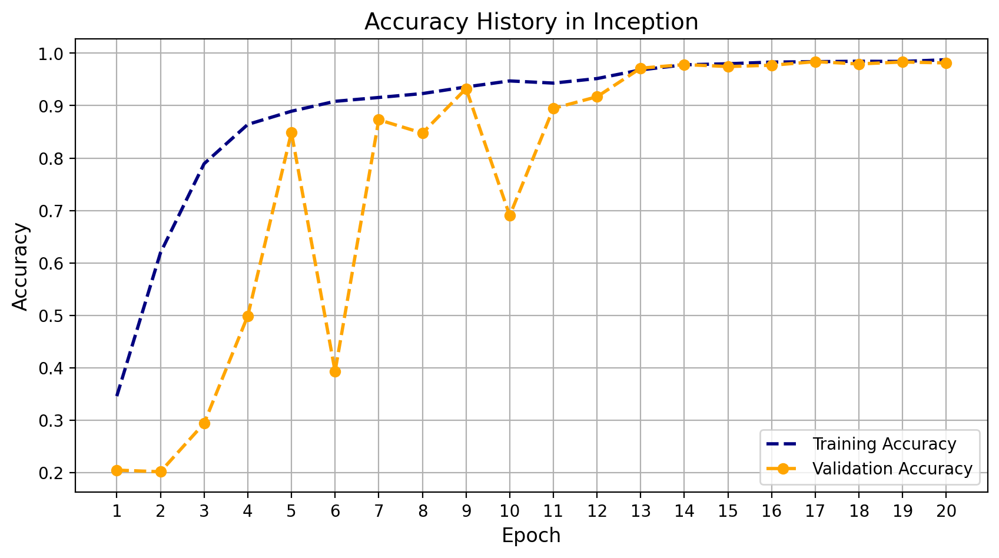

In [40]:
plt.figure(figsize=(10, 5), dpi=200)

plt.plot(epoch_count, train_accuracy_inception, 'r--', color='navy', label='Training Accuracy', linewidth=2)
plt.plot(epoch_count, valid_accuracy_inception, '--bo', color='orange', label='Validation Accuracy', linewidth=2)

plt.title('Accuracy History in Inception', fontsize=14)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)

plt.grid(True)
plt.legend(loc='lower right')

plt.xticks(np.arange(1, 21, 1))

plt.show()